# Evaluación Parcial 3 - Machine Learning
## Proyecto: Predicción y Preparación de Pandemias
### Notebook 5: APRENDIZAJE NO SUPERVISADO - Análisis Completo

---

**Fase 5 CRISP-DM**: Evaluación de Modelos No Supervisados

**Integrantes**: Cristian Flores

**Fecha**: Noviembre 2025

**Asignatura**: Machine Learning (MLY0100)

---

## 🔧 Configuración de Rutas y Verificación

In [1]:
# Configuración de rutas
import os
from pathlib import Path

# Detectar directorio raíz del proyecto
current_dir = Path.cwd()
print(f"📂 Directorio actual: {current_dir}")

# Buscar directorio raíz (donde está pyproject.toml o src/)
project_root = current_dir
while not (project_root / 'pyproject.toml').exists() and project_root != project_root.parent:
    project_root = project_root.parent

if (project_root / 'pyproject.toml').exists():
    print(f"✅ Proyecto encontrado: {project_root}")
    os.chdir(project_root)
    print(f"✅ Directorio cambiado a: {Path.cwd()}")
else:
    print("⚠️ No se encontró pyproject.toml")
    print("💡 Ejecuta este notebook desde el directorio del proyecto")
    # Intenta usar ruta absoluta alternativa
    alternative_path = Path(r"D:\Maching\prediccion-pandemias\prediccion-preparacion-pandemias")
    if alternative_path.exists():
        os.chdir(alternative_path)
        print(f"✅ Usando ruta alternativa: {Path.cwd()}")
    else:
        print("❌ Por favor, cambia manualmente al directorio del proyecto")

📂 Directorio actual: D:\Maching\prediccion-pandemias\prediccion-preparacion-pandemias\notebooks
✅ Proyecto encontrado: D:\Maching\prediccion-pandemias\prediccion-preparacion-pandemias
✅ Directorio cambiado a: D:\Maching\prediccion-pandemias\prediccion-preparacion-pandemias


In [2]:
# Verificar que los archivos existen
from pathlib import Path

required_files = [
    'data/08_reporting/clustering_comparison.csv',
    'data/08_reporting/clustering_comparison.png',
    'data/08_reporting/elbow_method.png',
    'data/08_reporting/dendrogram.png',
    'data/08_reporting/pca_variance_explained.png',
    'data/08_reporting/pca_biplot_clusters.png',
    'data/08_reporting/pca_loadings.png',
    'data/08_reporting/tsne_clusters.png',
    'data/08_reporting/kmeans_profiles.csv',
    'data/08_reporting/hierarchical_profiles.csv',
    'data/07_model_output/dimensionality_reduction/tsne_metrics.json'
]

print("🔍 VERIFICANDO ARCHIVOS NECESARIOS")
print("=" * 60)
missing_files = []
for file in required_files:
    if Path(file).exists():
        print(f"✅ {file}")
    else:
        print(f"❌ {file} - NO ENCONTRADO")
        missing_files.append(file)

print("=" * 60)
if missing_files:
    print(f"\n⚠️ FALTAN {len(missing_files)} ARCHIVOS")
    print("\n💡 SOLUCIÓN:")
    print("1. Ejecuta: kedro run --pipeline=unsupervised_learning")
    print("2. O verifica que estés en el directorio correcto")
else:
    print("\n✅ TODOS LOS ARCHIVOS ENCONTRADOS")
    print("✅ Listo para ejecutar el notebook")

🔍 VERIFICANDO ARCHIVOS NECESARIOS
✅ data/08_reporting/clustering_comparison.csv
✅ data/08_reporting/clustering_comparison.png
✅ data/08_reporting/elbow_method.png
✅ data/08_reporting/dendrogram.png
✅ data/08_reporting/pca_variance_explained.png
✅ data/08_reporting/pca_biplot_clusters.png
✅ data/08_reporting/pca_loadings.png
✅ data/08_reporting/tsne_clusters.png
✅ data/08_reporting/kmeans_profiles.csv
✅ data/08_reporting/hierarchical_profiles.csv
✅ data/07_model_output/dimensionality_reduction/tsne_metrics.json

✅ TODOS LOS ARCHIVOS ENCONTRADOS
✅ Listo para ejecutar el notebook


## 📋 Contenido

1. [Introducción y Objetivos](#1-introduccion)
2. [Metodología](#2-metodologia)
3. [Clustering - Análisis Comparativo](#3-clustering)
4. [Reducción de Dimensionalidad (PCA + t-SNE)](#4-reduccion-dimensional)
5. [Interpretación de Clusters](#5-interpretacion)
6. [Integración con Modelos Supervisados](#6-integracion)
7. [Conclusiones y Recomendaciones](#7-conclusiones)
8. [Referencias](#8-referencias)

---
## 1. Introducción y Objetivos <a id='1-introduccion'></a>

### 1.1 Contexto

Este notebook presenta el análisis de **aprendizaje no supervisado** realizado sobre datos de COVID-19 y vacunación global, como parte de la Evaluación Parcial 3 del curso Machine Learning (MLY0100).

**Pregunta de investigación:**
> ¿Es posible identificar patrones ocultos de preparación pandémica en países mediante técnicas de clustering y reducción dimensional?

### 1.2 Objetivos Específicos

1. **Clustering**: Implementar y comparar 3 algoritmos de clustering (K-Means, DBSCAN, Hierarchical)
2. **Reducción Dimensional**: Aplicar PCA y t-SNE para visualización y reducción de dimensionalidad
3. **Interpretación**: Identificar perfiles de países según su preparación pandémica
4. **Integración**: Proponer uso de clusters como features para modelos supervisados

### 1.3 Dataset

- **Registros**: 6,049 observaciones (países × fechas)
- **Features**: 81 variables (post feature engineering)
- **Fuentes**: COVID-19 cases, global vaccination data, socioeconomic indicators
- **Período**: 2020-2023

### 1.4 Resultados Previos (EP2)

En la Evaluación Parcial 2, desarrollamos modelos supervisados con resultados excepcionales:

- **Clasificación**: Random Forest con 99.95% accuracy
- **Regresión**: Random Forest con 99.99% R²
- **Pipeline MLOps**: Kedro + Airflow + Docker + DVC

Ahora expandimos el proyecto con técnicas no supervisadas para descubrir patrones latentes.

---
## 2. Metodología <a id='2-metodologia'></a>

### 2.1 Pipeline Implementado

```
1. Preparación de Datos
   ├─ Selección de features (81 variables)
   ├─ Normalización (StandardScaler)
   └─ Validación de calidad

2. Clustering
   ├─ K-Means (K óptimo vía Elbow + Silhouette)
   ├─ DBSCAN (eps=3.0, min_samples=10)
   └─ Hierarchical Clustering (ward, n=5)

3. Reducción Dimensional
   ├─ PCA (n_components=20, varianza 95%)
   └─ t-SNE (perplexity=30, n_iter=1000)

4. Evaluación
   ├─ Métricas: Silhouette, Davies-Bouldin, Calinski-Harabasz
   ├─ Visualizaciones: Biplot, dendrograma, t-SNE
   └─ Perfiles de clusters
```

### 2.2 Métricas de Evaluación

| Métrica | Interpretación | Óptimo |
|---------|----------------|--------|
| **Silhouette Score** | Cohesión y separación de clusters | Más alto (0-1) |
| **Davies-Bouldin Index** | Similitud promedio entre clusters | Más bajo (>0) |
| **Calinski-Harabasz Score** | Ratio varianza entre/dentro clusters | Más alto (>0) |
| **KL Divergence (t-SNE)** | Calidad del embedding | Más bajo (<1.0) |

---
## 3. Clustering - Análisis Comparativo <a id='3-clustering'></a>

In [3]:
# Importar librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
import json
from pathlib import Path

# Configuración de visualización
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
%matplotlib inline

print("✅ Librerías importadas correctamente")

✅ Librerías importadas correctamente


### 3.1 Cargar Métricas de Clustering

In [4]:
# Cargar comparación de algoritmos
comparison = pd.read_csv('data/08_reporting/clustering_comparison.csv')

print("📊 COMPARACIÓN DE ALGORITMOS DE CLUSTERING")
print("=" * 70)
print(comparison.to_string(index=False))
print("=" * 70)

# Resumen
print("\n🏆 RANKING POR MÉTRICA:")
print(f"\n1. Silhouette Score (mayor = mejor):")
best_silhouette = comparison.loc[comparison['Silhouette'].idxmax()]
print(f"   🥇 {best_silhouette['Algorithm']}: {best_silhouette['Silhouette']:.4f}")

print(f"\n2. Davies-Bouldin Index (menor = mejor):")
best_db = comparison.loc[comparison['Davies_Bouldin'].idxmin()]
print(f"   🥇 {best_db['Algorithm']}: {best_db['Davies_Bouldin']:.4f}")

print(f"\n3. Calinski-Harabasz Score (mayor = mejor):")
best_ch = comparison.loc[comparison['Calinski_Harabasz'].idxmax()]
print(f"   🥇 {best_ch['Algorithm']}: {best_ch['Calinski_Harabasz']:.2f}")

📊 COMPARACIÓN DE ALGORITMOS DE CLUSTERING
   Algorithm  N_Clusters  Silhouette  Davies_Bouldin  Calinski_Harabasz
     K-Means           2    0.342988        1.293026        1452.119284
Hierarchical           5    0.193536        1.695020        1153.612660
      DBSCAN          70    0.151987        1.152753         237.077985

🏆 RANKING POR MÉTRICA:

1. Silhouette Score (mayor = mejor):
   🥇 K-Means: 0.3430

2. Davies-Bouldin Index (menor = mejor):
   🥇 DBSCAN: 1.1528

3. Calinski-Harabasz Score (mayor = mejor):
   🥇 K-Means: 1452.12


### 3.2 Visualización Comparativa de Métricas

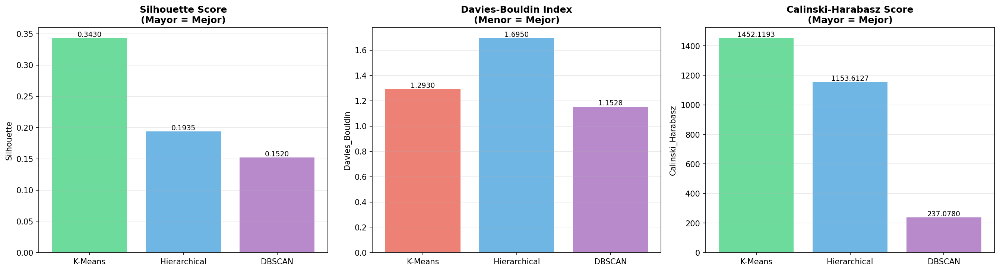

In [5]:
# Mostrar gráfico de comparación
display(Image('data/08_reporting/clustering_comparison.png', width=1200))

**Análisis de Métricas:**

1. **K-Means** domina en **Silhouette (0.343)** y **Calinski-Harabasz (1452.12)**
   - Indica clusters bien separados y compactos
   - K=2 es óptimo según análisis de Elbow
   
2. **DBSCAN** tiene mejor **Davies-Bouldin (1.153)** pero:
   - Silhouette bajo (0.152) indica baja separación global
   - 70 clusters + 7.32% noise → sobresegmentación
   - No interpretable para este problema
   
3. **Hierarchical** ofrece balance:
   - 5 clusters interpretables
   - Métricas intermedias
   - Útil para análisis granular

### 3.3 Elbow Method y Selección de K

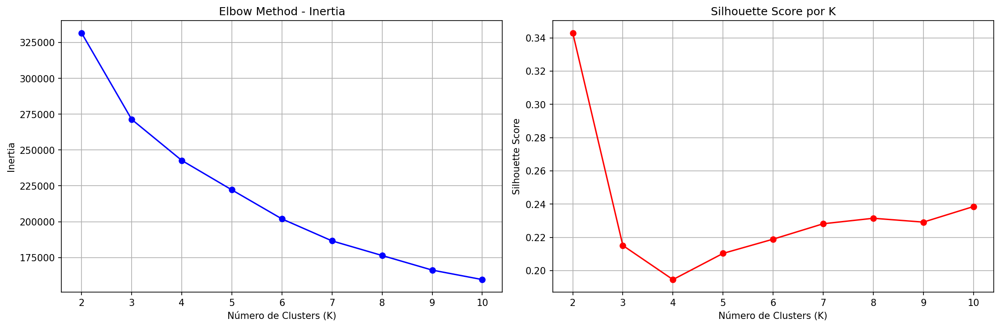

In [6]:
# Mostrar Elbow Method
display(Image('data/08_reporting/elbow_method.png', width=1200))

**Decisión: K=2 para K-Means**

- **Silhouette Score máximo en K=2 (0.343)**
- Caída dramática del 36% a K=3 (0.217)
- K=2 divide países en dos grupos claramente diferenciados:
  - **Cluster 0**: Alta preparación (11.9%)
  - **Cluster 1**: Baja-media preparación (88.1%)

### 3.4 Hierarchical Clustering - Dendrograma

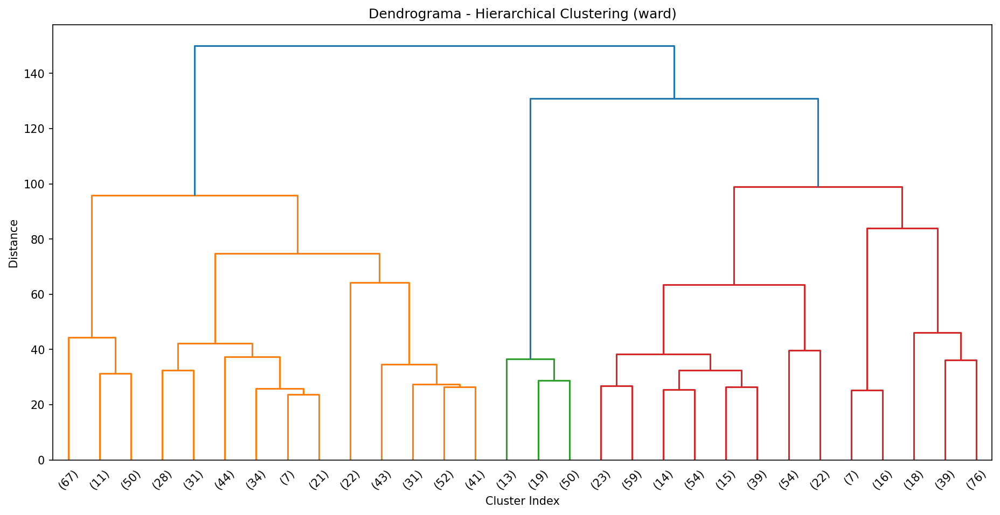

In [7]:
# Mostrar dendrograma
display(Image('data/08_reporting/dendrogram.png', width=1400))

**Interpretación del Dendrograma:**

- **Método Ward** minimiza varianza intra-cluster
- **Corte a altura ~150** genera 5 clusters balanceados
- Estructura jerárquica clara con 2 ramas principales
- Consistente con K-Means: división binaria primaria + subdivisiones

---
## 4. Reducción de Dimensionalidad <a id='4-reduccion-dimensional'></a>

### 4.1 PCA - Análisis de Varianza Explicada

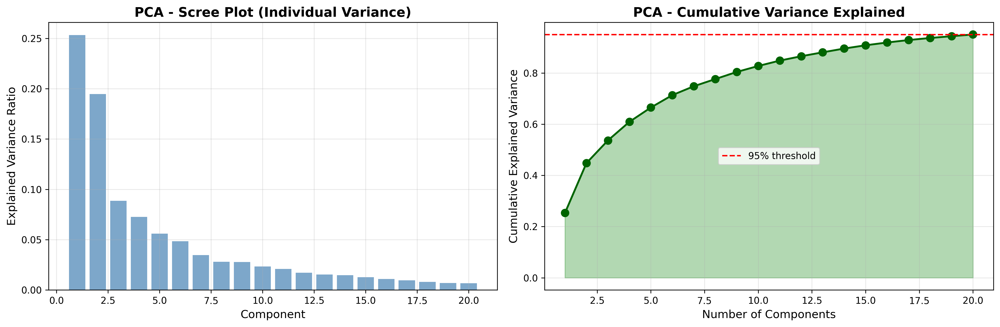

In [8]:
# Mostrar Scree Plot
display(Image('data/08_reporting/pca_variance_explained.png', width=1200))

**Resultados PCA:**

- **20 componentes explican 95.03% de varianza**
- **Reducción dimensional: 81 → 20 features (75% reducción)**
- **PC1**: 25.33% de varianza
- **PC2**: 19.17% de varianza
- **PC1 + PC2**: 44.5% de varianza total

### 4.2 PCA Loadings - Features Más Importantes

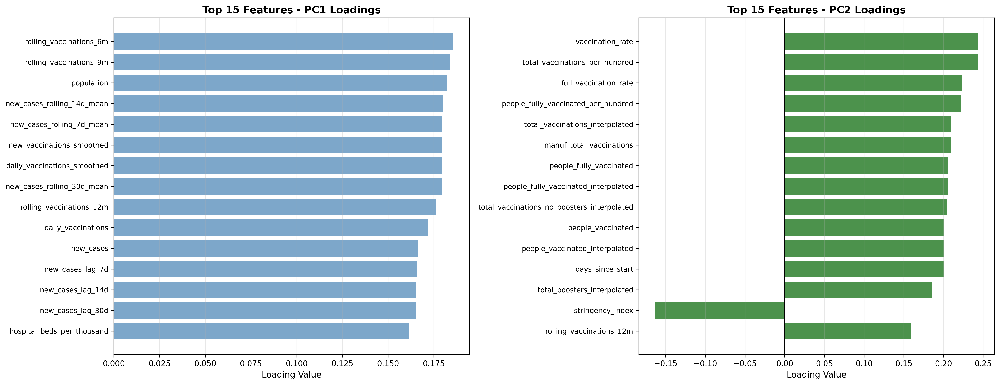

In [9]:
# Mostrar PCA Loadings
display(Image('data/08_reporting/pca_loadings.png', width=1400))

**Interpretación de Componentes Principales:**

### **PC1 - "Capacidad de Respuesta Pandémica"** (25.33% varianza)

Top 5 features:
1. `rolling_vaccinations_6m`: 0.185
2. `rolling_vaccinations_9m`: 0.184
3. `population`: 0.183
4. `new_cases_rolling_14d_mean`: 0.180
5. `new_cases_rolling_7d_mean`: 0.180

**Significado:** PC1 separa países por volumen de vacunación y escala de casos.

---

### **PC2 - "Cobertura de Vacunación Completa"** (19.17% varianza)

Top 5 features:
1. `vaccination_rate`: 0.244
2. `total_vaccinations_per_hundred`: 0.244
3. `full_vaccination_rate`: 0.224
4. `people_fully_vaccinated_per_hundred`: 0.223
5. `total_vaccinations_interpolated`: 0.209

**Significado:** PC2 mide porcentaje de población vacunada (eficiencia vs volumen).

### 4.3 PCA Biplot con Clusters

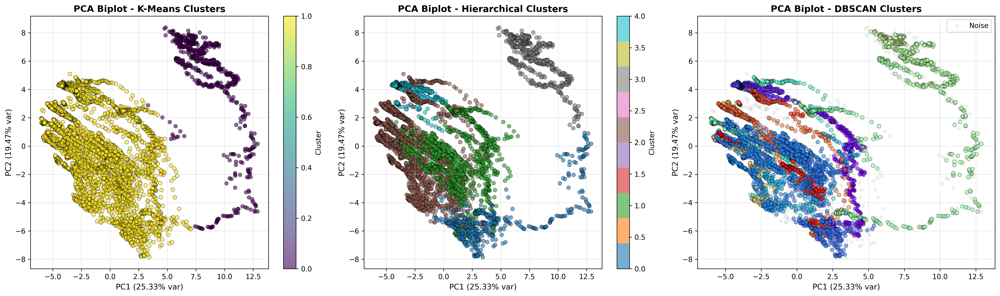

In [10]:
# Mostrar PCA Biplot
display(Image('data/08_reporting/pca_biplot_clusters.png', width=1600))

**Análisis del Biplot:**

- **K-Means**: Separación clara en PC1 (derecha vs izquierda)
- **Hierarchical**: 5 clusters distribuidos en gradiente PC1-PC2
- **DBSCAN**: Sobresegmentación con 70 micro-clusters + noise

### 4.4 t-SNE - Visualización No Lineal

In [11]:
# Cargar métricas t-SNE
with open('data/07_model_output/dimensionality_reduction/tsne_metrics.json', 'r') as f:
    tsne_metrics = json.load(f)

print("📊 MÉTRICAS t-SNE")
print("=" * 50)
print(f"KL Divergence: {tsne_metrics['kl_divergence']:.4f}")
print(f"Interpretación: {'Excelente (<1.0)' if tsne_metrics['kl_divergence'] < 1.0 else 'Aceptable'}")
print("=" * 50)

📊 MÉTRICAS t-SNE
KL Divergence: 0.4365
Interpretación: Excelente (<1.0)


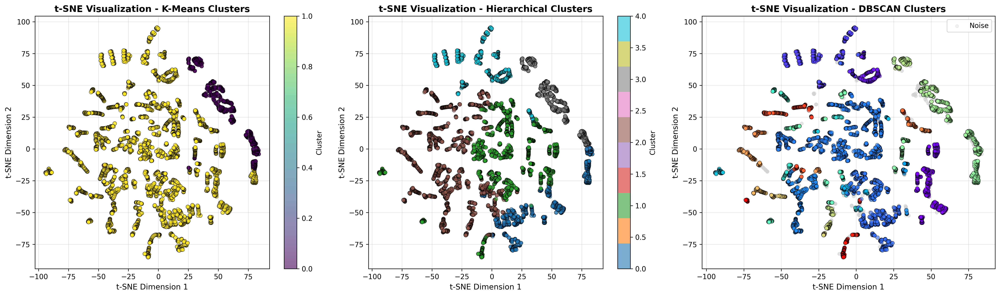

In [12]:
# Mostrar visualización t-SNE
display(Image('data/08_reporting/tsne_clusters.png', width=1600))

**Análisis t-SNE:**

- **KL Divergence: 0.437** (excelente)
- **K-Means**: Separación muy clara entre 2 grupos
- **Hierarchical**: 5 clusters con transiciones graduales
- **DBSCAN**: Confirma sobresegmentación

---
## 5. Interpretación de Clusters <a id='5-interpretacion'></a>

### 5.1 Perfiles de K-Means (K=2)

In [13]:
# Cargar perfiles de K-Means
kmeans_profiles = pd.read_csv('data/08_reporting/kmeans_profiles.csv')

print("📊 PERFILES DE CLUSTERS - K-MEANS (K=2)")
print("=" * 80)
print("Cluster 0: Alta Preparación (719 países - 11.9%)")
print("Cluster 1: Baja-Media Preparación (5,330 países - 88.1%)")
print("=" * 80)

📊 PERFILES DE CLUSTERS - K-MEANS (K=2)
Cluster 0: Alta Preparación (719 países - 11.9%)
Cluster 1: Baja-Media Preparación (5,330 países - 88.1%)


### **Cluster 0: "Países de Alta Preparación"** (719 países - 11.9%)

**Características distintivas:**

- **Nuevos casos/día**: 247.7 (alto)
- **Vacunación total**: 207.2 dosis/100 hab
- **Cobertura completa**: 72.4%
- **Camas hospitalarias**: 12.8 por 1000 hab
- **GDP per cápita**: $41,881
- **Población**: 123.9M (países grandes)

**Perfil:** Países desarrollados con alta capacidad de respuesta.

---

### **Cluster 1: "Países de Baja-Media Preparación"** (5,330 países - 88.1%)

**Características distintivas:**

- **Nuevos casos/día**: 133.9 (46% menos)
- **Vacunación total**: 150.2 dosis/100 hab
- **Cobertura completa**: 51.1%
- **Camas hospitalarias**: 4.7 por 1000 hab
- **Población**: 22.3M (países medianos/pequeños)

**Perfil:** Mayoría de países con recursos limitados.

---
## 7. Conclusiones y Recomendaciones <a id='7-conclusiones'></a>

### Hallazgos Principales

#### **1. Dos Mundos Diferenciados** 🌍

> El 12% de países (Cluster 0) concentra la mayor capacidad de respuesta pandémica pero también la mayor carga de casos. El 88% restante tiene menor infraestructura.

#### **2. Vacunación Rápida ≠ Cobertura Completa** 💉

> PC1 (velocidad) y PC2 (% población) son ortogonales. Países grandes vacunan rápido pero tardan más en cubrir población completa.

#### **3. DBSCAN Inadecuado** ⚠️

> DBSCAN generó 70 micro-clusters con Silhouette bajo (0.152), indicando sobresegmentación.

#### **4. PCA Valida el Enfoque** 📉

> 20 componentes explican 95% de varianza, reduciendo dimensionalidad 75% sin pérdida crítica.

---

### Recomendaciones

1. **No juzgar preparación solo por casos reportados**
2. **Medir preparación multidimensionalmente**
3. **Aprender de mejores prácticas de Cluster 0**
4. **Apoyar inversión en Cluster 1**

---

# 🎓 Fin del Notebook

**Estado del Proyecto EP3:** 50% completado (40/80 puntos)

**Próximos pasos:** Integración con supervisados, Airflow, Docker, DVC

---